In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import settings
import utils
import get_data

%matplotlib inline
p = sns.color_palette()

### Get Data

API: http://bitcoincharts.com/charts

period = ['1-min', '5-min', '15-min', '30-min', 'Hourly', '2-hour', '6-hour', '12-hour', 'Daily', 'Weekly']

market = ['coincheckJPY', 'krakenEUR', 'bitstampUSD', 'okcoinCNY', 'btcnCNY', 'krakenUSD', 'itbitUSD', 'bitbayPLN', 'btcoidIDR', 'localbtcRUB', 'localbtcGBP', 'btcdeEUR', 'coinfloorGBP', 'localbtcUSD']

In [2]:
# get_data.get('data/datas.csv', period='6-hour', market='bitstampUSD')

In [3]:
df = pd.read_csv('data/datas.csv', sep=',')

In [4]:
print('Number of rows: {}, Number of columns: {}'.format(*df.shape))

Number of rows: 51114, Number of columns: 8


In [4]:
df.head(20)

,Timestamp,Open,High,Low,Close,Volume_BTC,Volume_Currency,Weighted_Price
0,1315918800,5.800000e+00,6.000000e+00,5.800000e+00,6.000000e+00,2.500000e+01,1.491900e+02,5.967600e+00
1,1315922400,5.950000e+00,5.950000e+00,5.760000e+00,5.760000e+00,2.235398e+01,1.320410e+02,5.906823e+00
2,1315926000,5.650000e+00,5.650000e+00,5.650000e+00,5.650000e+00,2.542000e+00,1.436230e+01,5.650000e+00
3,1315929600,1.700000e+308,1.700000e+308,1.700000e+308,1.700000e+308,1.700000e+308,1.700000e+308,1.700000e+308
4,1315933200,1.700000e+308,1.700000e+308,1.700000e+308,1.700000e+308,1.700000e+308,1.700000e+308,1.700000e+308
5,1315936800,1.700000e+308,1.700000e+308,1.700000e+308,1.700000e+308,1.700000e+308,1.700000e+308,1.700000e+308
6,1315940400,5.920000e+00,5.970000e+00,5.920000e+00,5.970000e+00,8.475400e+00,5.050407e+01,5.958901e+00
7,1315944000,1.700000e+308,1.700000e+308,1.700000e+308,1.700000e+308,1.700000e+308,1.700000e+308,1.700000e+308
8,1315947600,1.700000e+308,1.700000e+308,1.700000e+308,1.700000e+308,1.700000e+308,1.700000e+308,1.700000e+308
9,1315951200,1.700000e+308,1.700000e+308,1.700000e+308,1.700000e+308,1.700000e+308,1.700000e+308,1.700000e+308


In [5]:
df.describe()

,Timestamp,Open,High,Low,Close,Volume_BTC,Volume_Currency,Weighted_Price
count,5.075600e+04,5.075600e+04,5.075600e+04,5.075600e+04,5.075600e+04,5.075600e+04,5.075600e+04,5.075600e+04
mean,1.407472e+09,inf,inf,inf,inf,inf,inf,inf
std,5.270689e+07,inf,inf,inf,inf,inf,inf,inf
min,1.315919e+09,2.220000e+00,2.230000e+00,1.500000e+00,2.230000e+00,9.700000e-04,1.001040e-02,2.228288e+00
25%,1.361872e+09,1.730000e+02,1.787350e+02,1.685900e+02,1.737500e+02,9.690693e+01,2.425353e+04,1.735408e+02
50%,1.407490e+09,4.174750e+02,4.188300e+02,4.158200e+02,4.175000e+02,2.608530e+02,9.296117e+04,4.173782e+02
75%,1.453108e+09,7.309825e+02,7.346125e+02,7.280000e+02,7.310000e+02,7.569582e+02,3.547310e+05,7.310300e+02
max,1.498727e+09,1.700000e+308,1.700000e+308,1.700000e+308,1.700000e+308,1.700000e+308,1.700000e+308,1.700000e+308


### Preprocessing

Drop rows with 0.00 values

In [6]:
df = utils.dropna(df)

In [7]:
print('Number of rows: {}, Number of columns: {}'.format(*df.shape))

Number of rows: 45005, Number of columns: 8


In [8]:
df.head(20)

,Timestamp,Open,High,Low,Close,Volume_BTC,Volume_Currency,Weighted_Price
0,1315918800,5.80,6.00,5.80,6.00,25.000000,149.190000,5.967600
1,1315922400,5.95,5.95,5.76,5.76,22.353982,132.041023,5.906823
2,1315926000,5.65,5.65,5.65,5.65,2.542000,14.362300,5.650000
6,1315940400,5.92,5.97,5.92,5.97,8.475400,50.504066,5.958901
18,1315983600,5.58,5.62,5.54,5.62,16.425700,91.537032,5.572793
19,1315987200,5.57,5.57,5.55,5.56,12.347499,68.711094,5.564778
20,1315990800,5.57,5.61,5.57,5.61,4.890346,27.261422,5.574538
21,1315994400,5.65,5.65,5.65,5.65,5.445139,30.765035,5.650000
22,1315998000,5.72,5.72,5.52,5.52,20.000000,112.326510,5.616325
26,1316012400,5.52,5.53,5.52,5.53,2.037300,11.253721,5.523841


In [9]:
df.describe()

,Timestamp,Open,High,Low,Close,Volume_BTC,Volume_Currency,Weighted_Price
count,4.500500e+04,45005.000000,45005.000000,45005.000000,45005.000000,45005.000000,4.500500e+04,45005.000000
mean,1.417136e+09,442.899397,445.305261,439.988703,442.944850,446.600629,2.209945e+05,442.683424
std,4.769884e+07,448.885246,451.897278,445.380795,449.018656,776.011174,5.038884e+05,448.692501
min,1.315919e+09,2.220000,2.230000,1.500000,2.230000,0.000970,1.001040e-02,2.228288
25%,1.376978e+09,123.770000,124.190000,123.010000,123.800000,83.693936,1.879241e+04,123.638807
50%,1.417446e+09,369.620000,371.520000,366.870000,369.590000,212.391365,7.241525e+04,369.223798
75%,1.458277e+09,608.980000,610.450000,607.040000,608.980000,491.821907,2.056799e+05,608.594240
max,1.498727e+09,2968.530000,2980.000000,2955.260000,2969.670000,20551.251040,1.476893e+07,2972.018497


### Target Value

Target value min 2.230 max 2969.670 mean 442.945 std 449.014


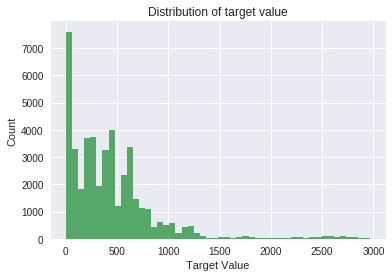

In [10]:
y = df['Close'].values
plt.hist(df.Close, bins=50, color=p[1])
plt.xlabel('Target Value')
plt.ylabel('Count')
plt.title('Distribution of target value')
print('Target value min {0:.3f} max {1:.3f} mean {2:.3f} std {3:.3f}'.format(np.min(y), np.max(y), np.mean(y), np.std(y)))

### Target value over time

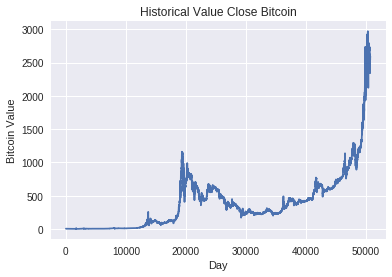

In [11]:
plt.figure()
plt.plot(df.index.tolist(), df.Close.values)
plt.title("Historical Value Close Bitcoin")
plt.xlabel('Day')
plt.ylabel('Bitcoin Value')
plt.show()

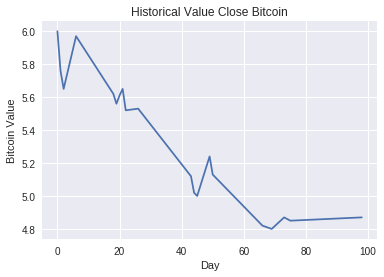

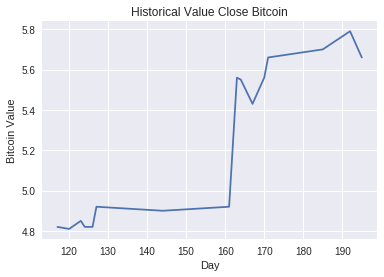

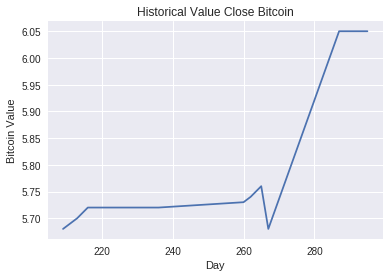

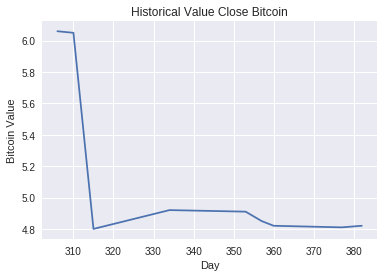

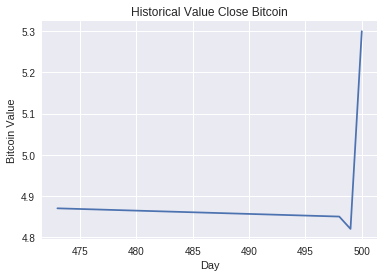

...

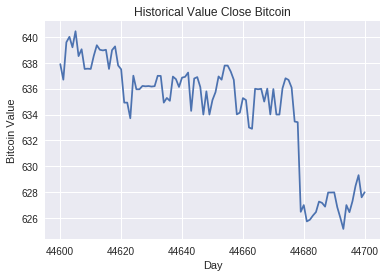

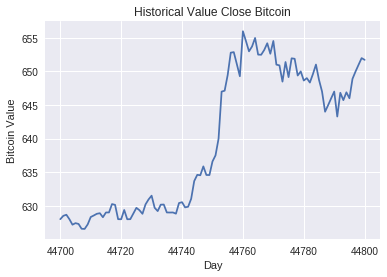

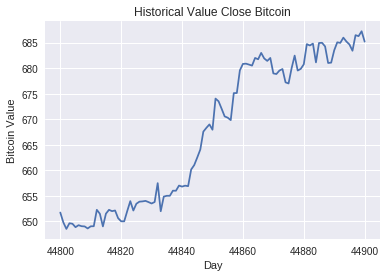

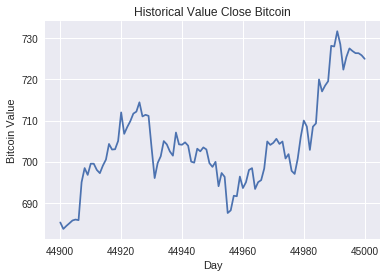

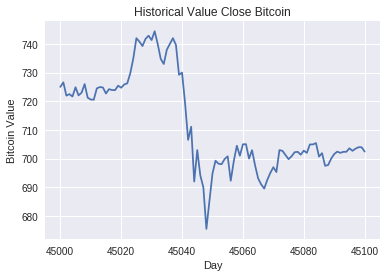

In [12]:
aux = 0
while True:

    plt.figure()
    plt.plot(df.loc[aux:aux+100].index.tolist(), df.loc[aux:aux+100].Close.values)
    plt.title("Historical Value Close Bitcoin")
    plt.xlabel('Day')
    plt.ylabel('Bitcoin Value')
    plt.show()
    aux += 100
    if aux > df.shape[0]:
        break
